In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
%matplotlib inline

In [2]:
path = "/datasets/SemEval/semeval-2023-task-1-V-WSD-train-v1/train_v1/train.data.v1.txt"
label_path = "/datasets/SemEval/semeval-2023-task-1-V-WSD-train-v1/train_v1/train.gold.v1.txt"
img_path = "/datasets/SemEval/semeval-2023-task-1-V-WSD-train-v1/train_v1/train_images_v1/"

In [3]:
from random import sample
with open(path, "r") as data, open(label_path, 'r') as labels:
    data_text, labels_text = data.read(), labels.read()
    data_lines, labels_lines = data_text.split("\n"), labels_text.split("\n")
    lines = list(zip(data_lines, labels_lines))

In [4]:
import requests
import urllib
from requests_html import HTML
from requests_html import HTMLSession
import string
printable = set(string.printable)

def get_source(url):
    try:
        session = HTMLSession()
        response = session.get(url)
        return response

    except requests.exceptions.RequestException as e:
        print(e)

def get_results(query):
    query = "+".join(query.split())
    query = urllib.parse.quote_plus(query)
    response = get_source("https://www.google.com/search?q=" + query + "&hl=en")
    
    return response

def parse_results(response, threshold=3):
    SNIPPETS, RESULTS = 0, 1
    
    # as defined in the above constant, first idx is for snippet, second is for result scraping
    css_identifier_results = [".ILfuVd", ".tF2Cxc"]
    css_identifier_texts = [".hgKElc", ".VwiC3b"]
    css_identifier_link = ".yuRUbf a"

    outputs = []
    has_snippet = False # True if snippet exists for that particular search, else False
    count = 0 # Extracted result count
    
    for info, (css_identifier_result, css_identifier_text) in enumerate(zip(css_identifier_results, css_identifier_texts)):
        if has_snippet:
            continue
        results = response.html.find(css_identifier_result)
        output = []
        
        for result in results:
            has_link = result.find(css_identifier_link, first=True) 
            if info == SNIPPETS:
                text = result.find(css_identifier_text, first=True).text
                output.append(text)
                has_snippet = True
                
            elif info == RESULTS:
                if result.find(css_identifier_text, first=True) is not None and count < threshold:
                    text = result.find(css_identifier_text, first=True).text
                    output.append(text)
                    count += 1
                
        outputs.extend(output)
        
    return outputs, has_snippet

def google_search(query):
    response = get_results(query)
    info, has_snippet = parse_results(response)
    info = " . ".join(info)
    return info, has_snippet

Comandra is a monotypic genus containing the single species Comandra umbellata. Its common names include bastard toadflax, umbellate bastard toadflax, ... . The plant is sometimes parasitic on the roots of other plants and has creeping roots, small white flowers clustered at the top of each plant, and one-seeded ... . Comandra is a monotypic genus containing the single species Comandra umbellata. Its common names include bastard toadflax, umbellate bastard toadflax, ...
False
The Neural Network compares the person with celebrity faces and suggests the most similar ones. . Jul 25, 2019 — These everyday people are nearly identical to some very famous faces! · Rihanna and Her Mini-Me · Lady Gaga and Amethyst Rose · Laura Dern and ... . Feb 21, 2020 — While some celebs look only slightly different for their onscreen roles, these actors truly transformed their looks (if only temporarily) ...
False
Reggae is a music genre that originated in Jamaica in the late 1960s. The term also denotes th

/kuacc/users/oince22/miniconda3/envs/comp541/lib/python3.10/site-packages/PIL/TiffImagePlugin.py:845: UserWarning: Corrupt EXIF data.  Expecting to read 2 bytes but only got 0. 
  warnings.warn(str(msg))


Physostigma venenosum, the Calabar bean or ordeal bean, is a leguminous plant, Endemic to tropical Africa, with a seed poisonous to humans. . n. 1. (Chem.) An alkaloid resembling physostigmine and occurring with it in the calabar bean. Webster's Revised Unabridged Dictionary, published 1913 by G. & C. . Aug 22, 2014 — Its scientific name, Physostigma venenosum, came from the appearance of “a snooping beak-like solid appendage at the end of the stigma.” The ...
False
Apr 2, 2020 — A PANDEMIC is an epidemic that's spread over multiple countries or continents. ENDEMIC is something that belongs to a particular people or ... . Feb 19, 2021 — The WHO defines pandemics, epidemics, and endemic diseases based on a disease's rate of spread. Thus, the difference between an epidemic and a ... . An outbreak is a sudden rise in the number of cases of a disease more than normal expectancy in a community or geographical area. An outbreak can be declared an ...
False
Mar 25, 2021 — Introducing new tech

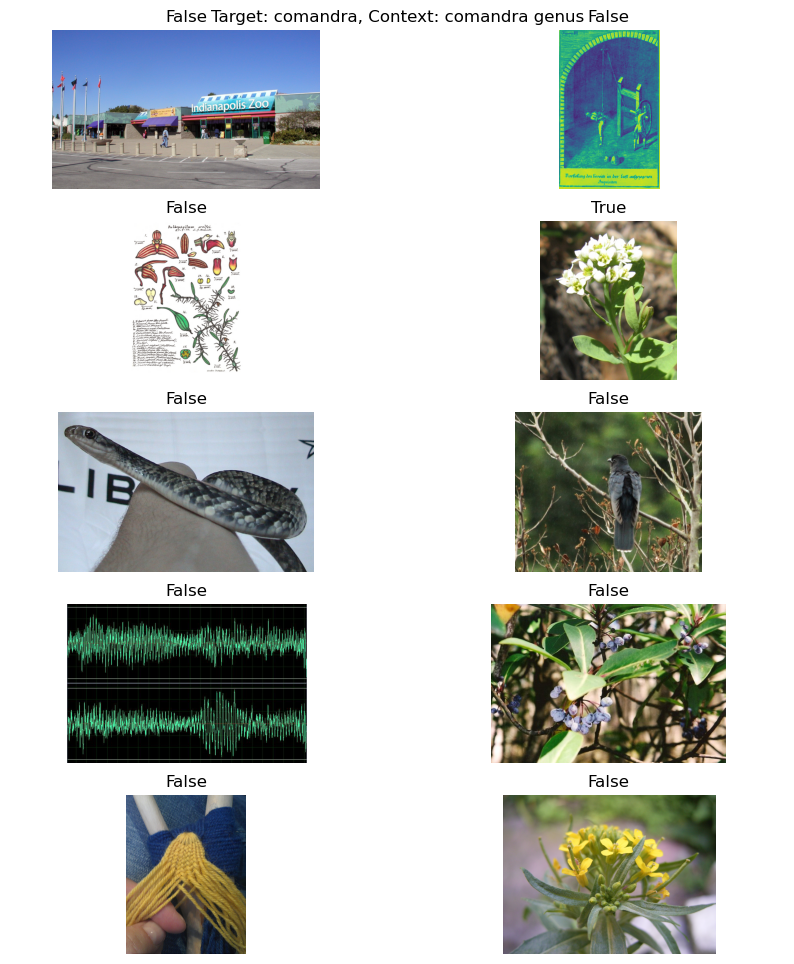

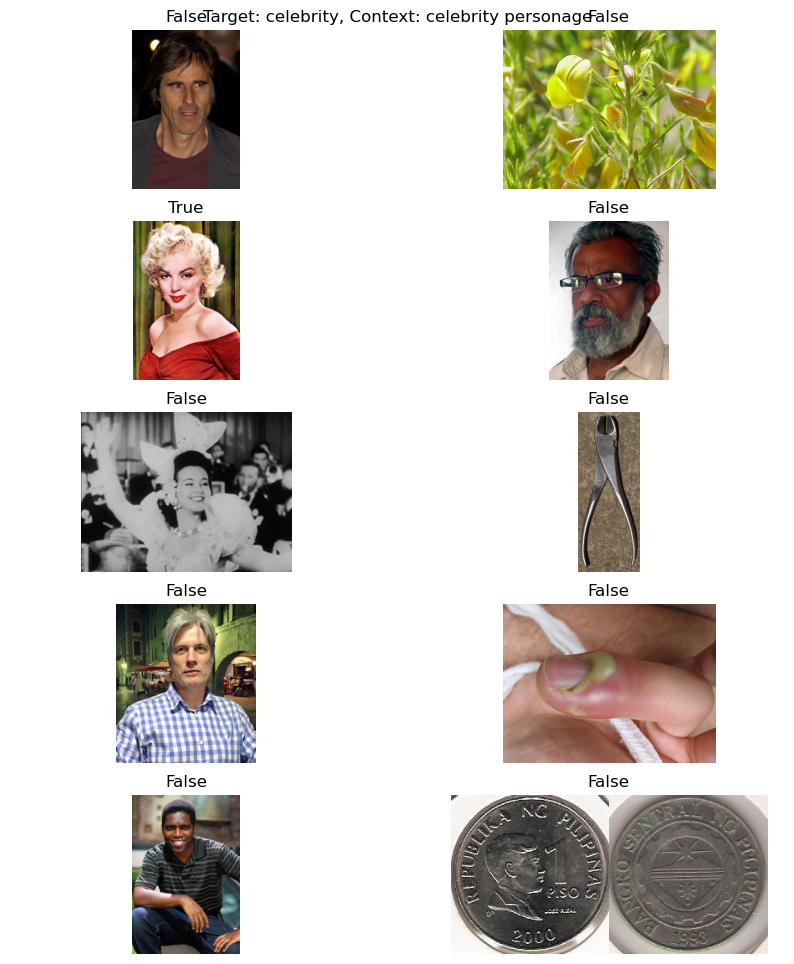

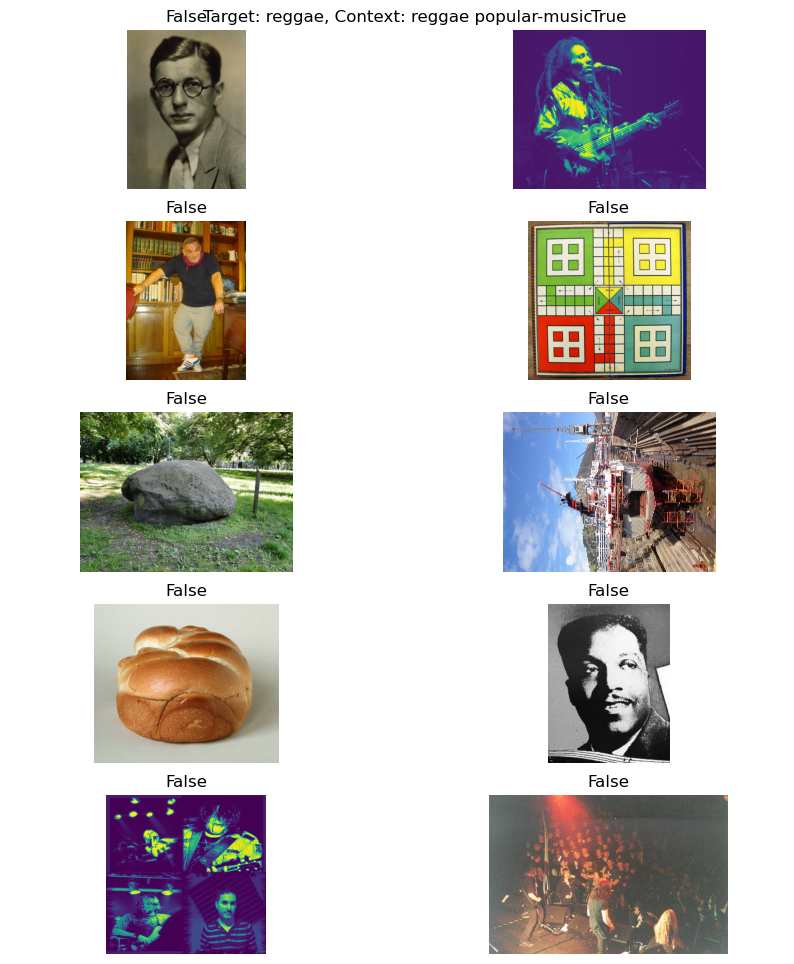

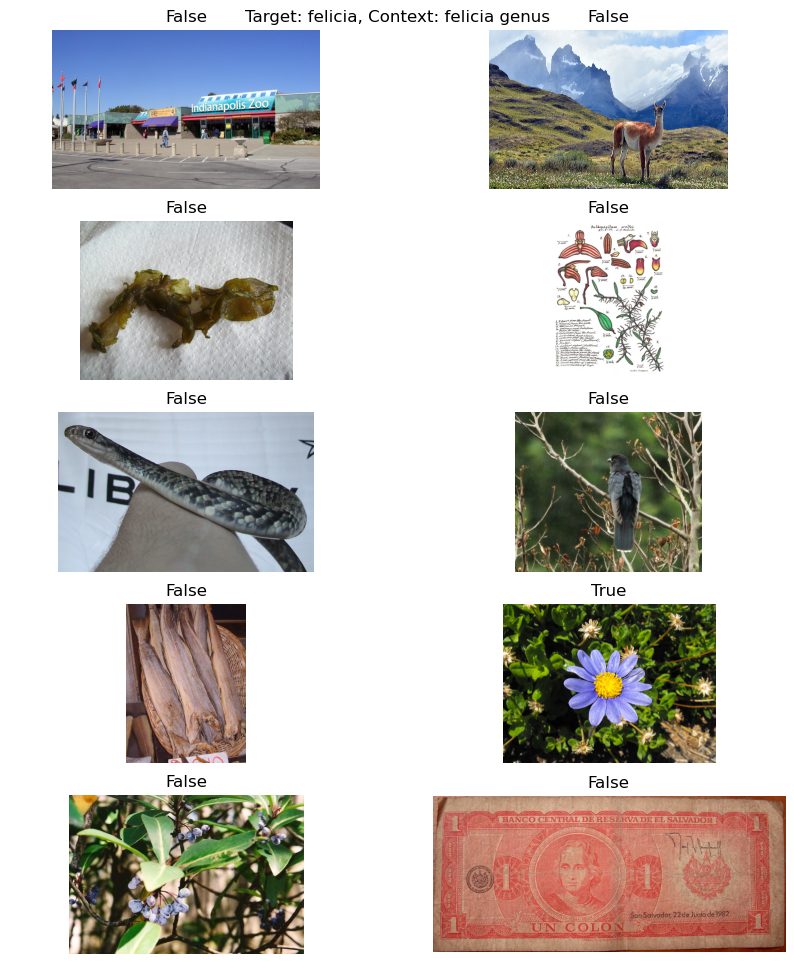

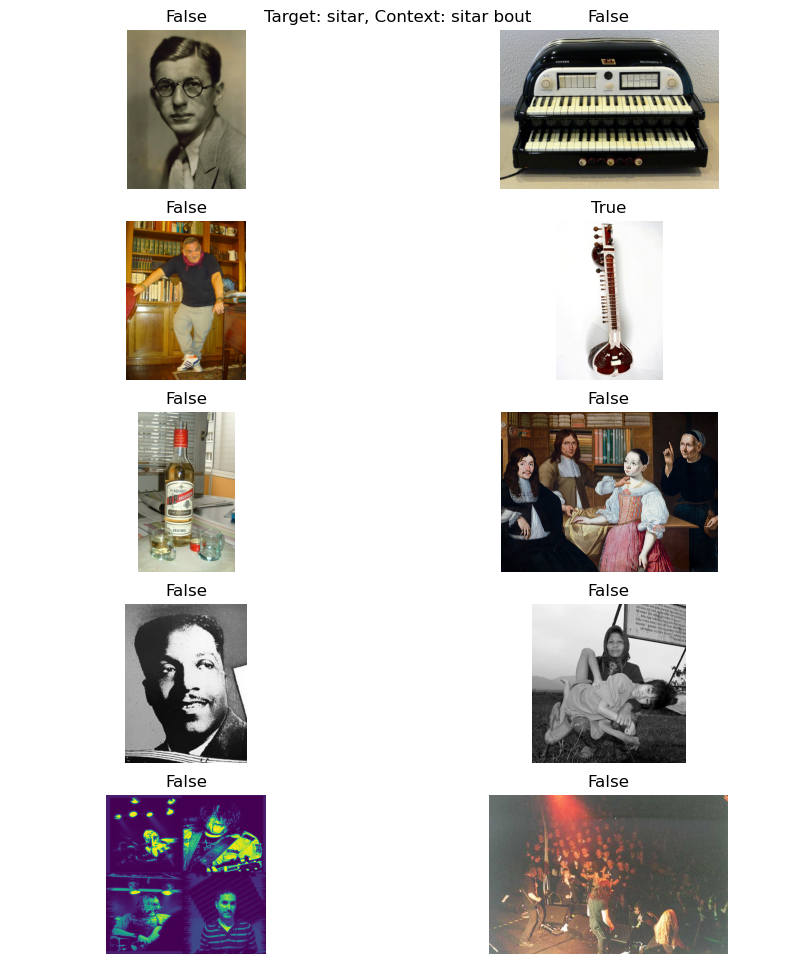

...

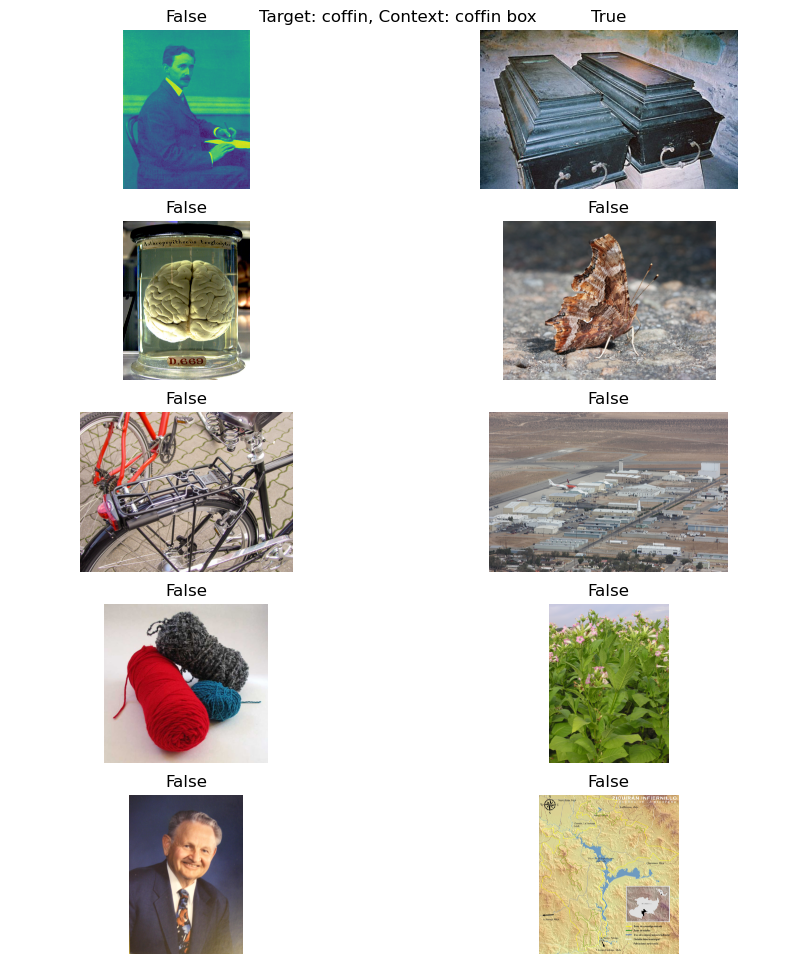

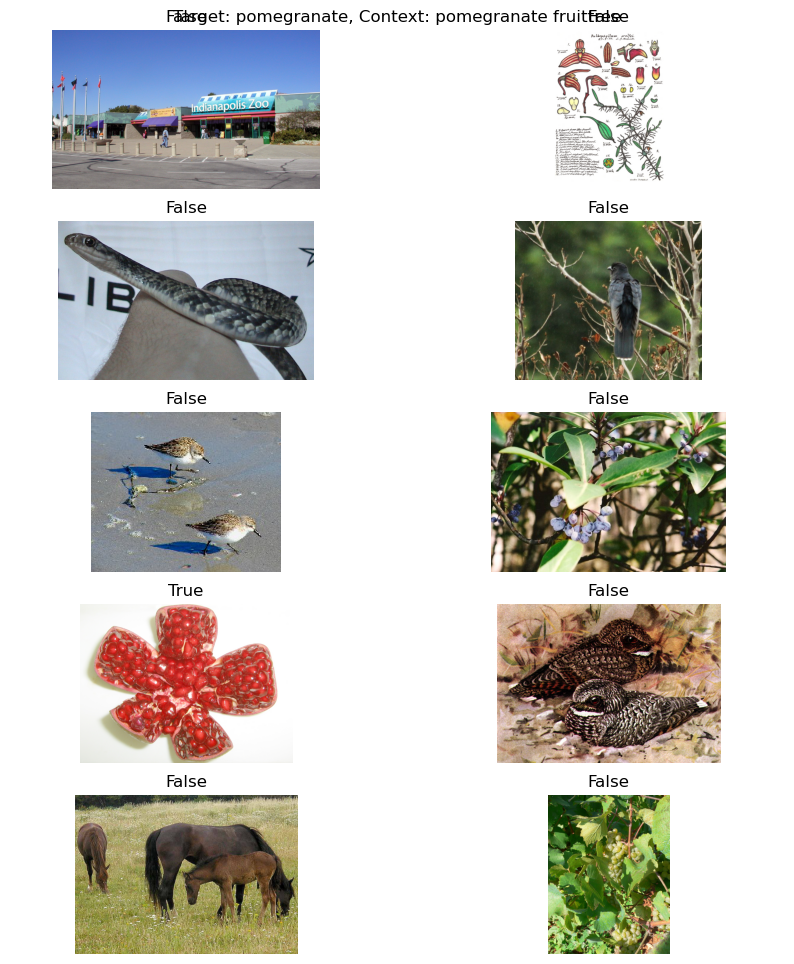

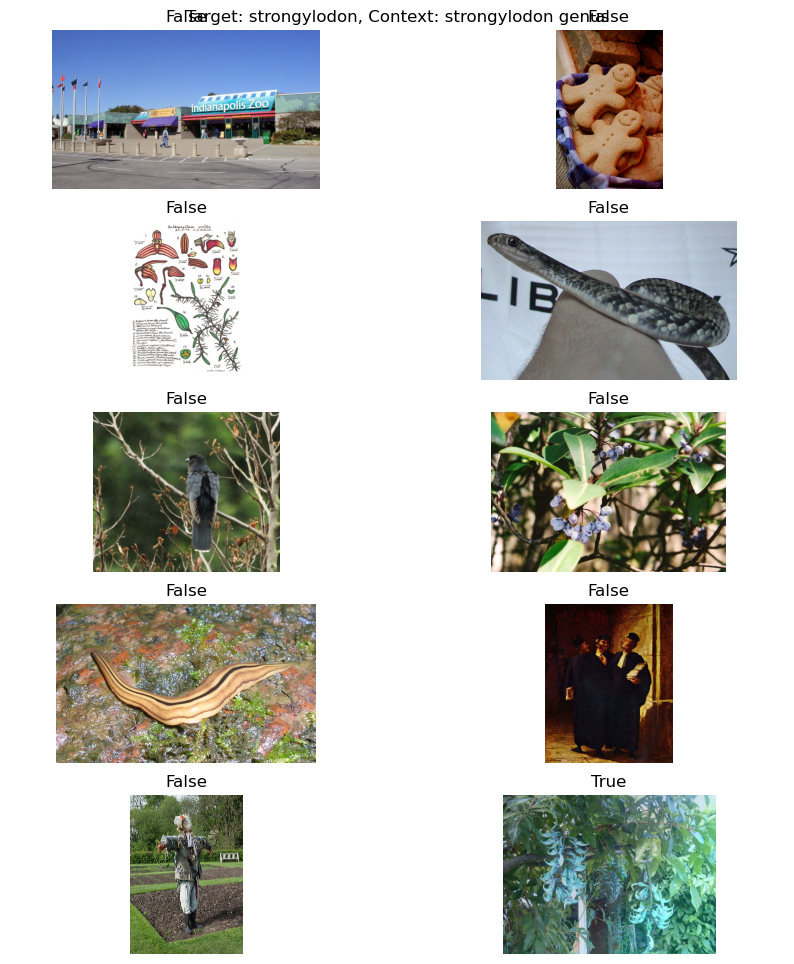

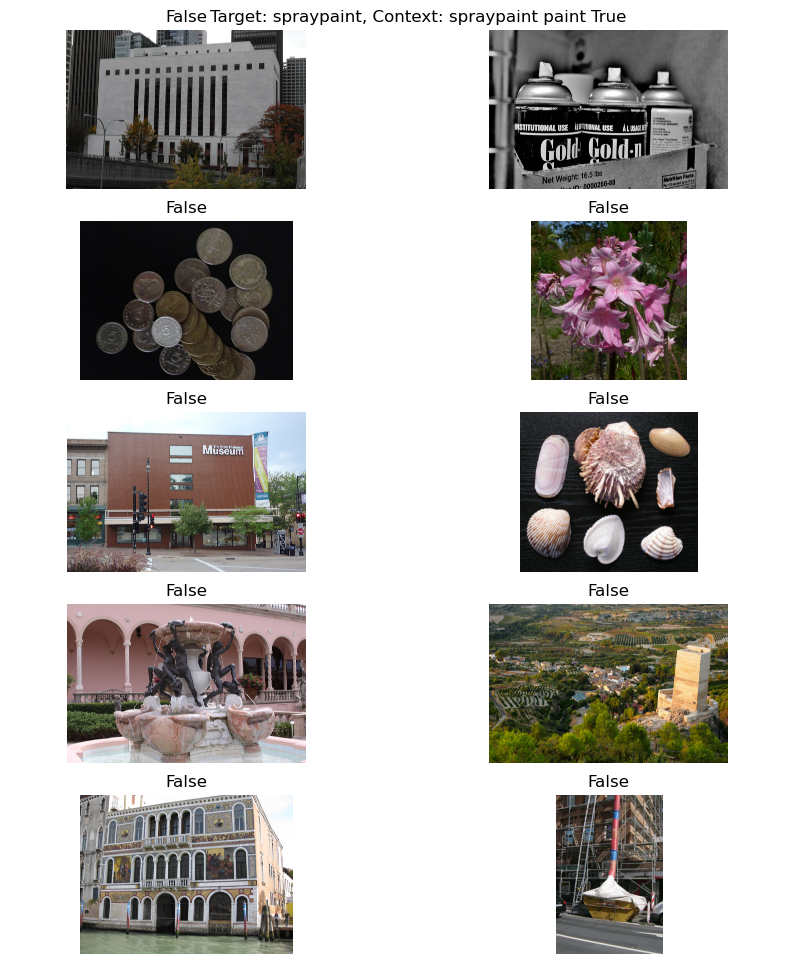

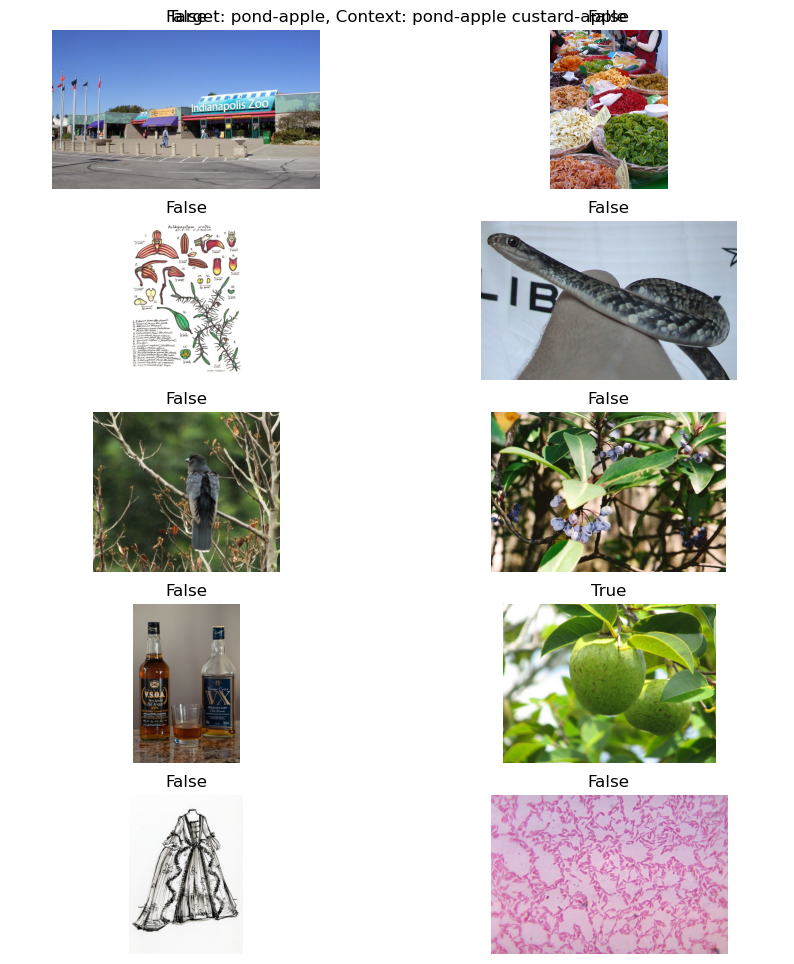

In [5]:
selected_lines = sample(lines, 15)
for data, label in selected_lines:
    
    fig = plt.figure(figsize=(10,12)) # specifying the overall grid size
    plt.axis('off')
    
    data = data.split("\t")
    target, context, images = data[0], data[1], data[2:]
    plt.title(f"Target: {target}, Context: {context}")
    scrape = google_search(f"What does {context} look like?")
    
    for item in scrape:
        print(item)

    for i, image in enumerate(images):
        img = mpimg.imread(f"{img_path}{image}")
        ax = fig.add_subplot(5, 2, i+1)
        ax.axis("off")
        
        ax.set_title("True" if image == label else "False")
        imgplot = plt.imshow(img)
        
    fig.show()

In [232]:
import requests
from pprint import pprint
import re

In [233]:
def prepare_context(context):
    return "_".join(context.split())

In [246]:
def clean_text(info):
    info = info.translate(str.maketrans('', '', string.punctuation))
    info = ''.join(filter(lambda x: x in printable, info))
    info = re.sub(r"[\s\n]+", " ", info)
    info = info.lower()
    info = re.sub(r'http\S+', '', info)
    info = re.sub(r'\(.*\)', '', info)
    info = re.sub(r'\.\.\.', '', info)
    return info

In [247]:
def cnet2str(obj, nl_context):
    info = ""
    for edge in obj["edges"]:
        if edge["rel"]["label"] in blacklist_relations:
            continue
        if edge["rel"]["label"] == "IsA":
            if "surfaceText" in edge and edge["surfaceText"] is not None:
                surf_txt = edge["surfaceText"]
                if "sense_label" in edge["start"]:
                    start_label, start_sense_label = edge["start"]["label"], " ".join(edge["start"]["sense_label"].split()[1:])
                    surf_txt = surf_txt.replace(start_label, start_label + " " + start_sense_label)
                info += " " +  re.sub(r"(\[\[|\]\])", "", surf_txt) + " ."
        elif edge["rel"]["label"]  == "RelatedTo":
            start_label, end_label = edge["start"]["label"], edge["end"]["label"]
            if start_label == cnet_context:
                info += " " + nl_context + related_to_connector + end_label + " . "
            else:
                info += " " + nl_context + related_to_connector + start_label + " . "

    info = info.strip()
    return info

In [248]:
current_relations = ['DerivedFrom', 'EtymologicallyDerivedFrom', 'ExternalURL', 'FormOf', 'HasContext', 'IsA', 'RelatedTo', 'Synonym']
blacklist_relations = ['DerivedFrom', 'EtymologicallyDerivedFrom', 'ExternalURL']
whitelist_relations = ['IsA', 'RelatedTo']

In [249]:
def get_data(nl_context):
    cnet_context = prepare_context(nl_context)
    info, has_snippet = google_search(nl_context)
    info = clean_text(info)
                                 
                                 
    obj = requests.get(f'http://api.conceptnet.io/c/en/{cnet_context}?offset=0&limit=80').json()
    if "error" in obj and obj["error"]["status"] == 404: # meaning that we could not find the whole context in ConceptNet
        if not has_snippet:  
            first_token, second_token = nl_context.split()[0], nl_context.split()[1]
            obj_1 = requests.get(f'http://api.conceptnet.io/c/en/{first_token}?offset=0&limit=80').json()
            obj_2 = requests.get(f'http://api.conceptnet.io/c/en/{second_token}?offset=0&limit=80').json()
            info_1, info_2 = cnet2str(obj_1, first_token), cnet2str(obj_2, second_token)
            info += info_1 + " " + info_2
    else:
        info += cnet2str(obj, nl_context)

    info = info.strip()
    return info

In [250]:
get_data("london tube")

'the london underground also known simply as the underground or by its nickname the tube is a rapid transit system serving greater london and some parts of the london underground network nicknamed the tube is an efficient way to get around london grab an oyster card and explore londons attractions tube map the navigation app that makes getting around on the london underground faster and easier the awardwinning tube map has over 22 million downloadslondon is a city . London is a city in England . london relates capital .  London is a place name . london relates borough .  london relates knowledge . magnetron artifact is a type of tube . torpedo tube artifact is a type of tube . straw artifact is a type of tube . acorn tube artifact is a type of tube . salpinx body is a type of tube . tube relates pipe .  gas-discharge tube artifact is a type of tube . drain surgery is a type of tube . tube relates cijev .  catheter artifact is a type of tube . pea shooter artifact is a type of tube . el